In [1]:
# Clean env (to avoid dependency issues)

# !pip freeze | xargs pip uninstall -y
# !conda clean --all -y
# !pip cache purge

IDEA
1. sdxl+inpaint with inverted mask over composite image
2. sdxl+inpaint+controlnets over composite image with inverted mask (modify lightning)
3. InstructPix2Pix for style adgustments over combined image
4. Img2Img on very low guidance level for small adjustments

In [2]:
# Install dependencies

# !pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118

# !pip install diffusers transformers accelerate
# !pip install opencv-python pillow numpy matplotlib
# !pip install controlnet-aux xformers invisible-watermark


In [3]:
from PIL import Image
import numpy as np
import cv2

from matplotlib import pyplot as plt

glasses_articles = [
    "110020220079_01.png", 
    "110020220086_01.png", 
    "110020234383_01.png", 
    "190605021125_01.png",
    "190605067703_01.png"
    ]

glasses_with_masks = []

for article in glasses_articles:
    
    new_glasses = Image.open(f"frames_new/imgs/{article}").convert("RGB").resize((512, 512))
    new_masks = Image.open(f"frames_new/masks/{article}").convert("L").resize((512, 512))
    
    glasses_with_masks.append((new_glasses, new_masks))

bg_img = Image.open("frames/facetest2.png").convert("RGB").resize((512, 512))

SDXL inpaint + inverted mask

In [5]:
# Load pipelines

import warnings
warnings.filterwarnings('ignore')

from PIL import ImageFilter

import torch
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, StableDiffusionXLInpaintPipeline, StableDiffusionInpaintPipeline, StableDiffusionInstructPix2PixPipeline, PaintByExamplePipeline, StableDiffusionImg2ImgPipeline, StableDiffusionPipeline, StableDiffusionControlNetPipeline, MultiControlNetModel
from controlnet_aux import CannyDetector, MidasDetector

dtype = torch.float16 if torch.cuda.is_available() else torch.float32
device = "cuda" if torch.cuda.is_available() else "cpu"

pipe_sdxl_inpaint = StableDiffusionXLInpaintPipeline.from_pretrained(
    "diffusers/stable-diffusion-xl-1.0-inpainting-0.1",
    torch_dtype=dtype,
    use_safetensors=True
).to(device)

pipe_sd_inpaint = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=dtype
).to(device)


Loading pipeline components...:  29%|██▊       | 2/7 [00:08<00:18,  3.73s/it]An error occurred while trying to fetch /teamspace/studios/this_studio/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /teamspace/studios/this_studio/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  71%|███████▏  | 5/7 [00:09<00:02,  1.32s/it]An error occurred while trying to fetch /teamspace/studios/this_studio/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /teamspace/studios/this_studio/.cache/huggingface/hub/mod

100%|██████████| 4/4 [00:01<00:00,  2.90it/s]


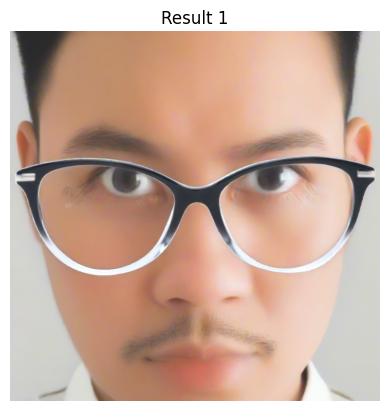

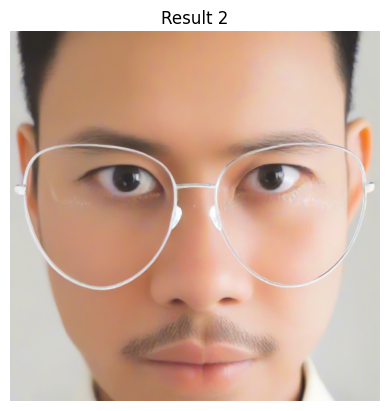

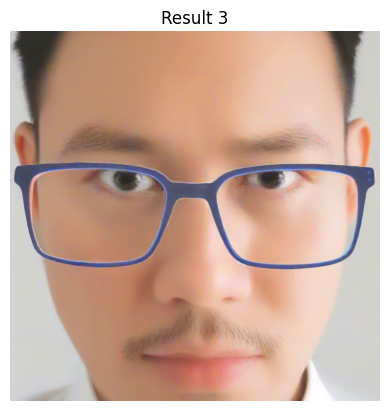

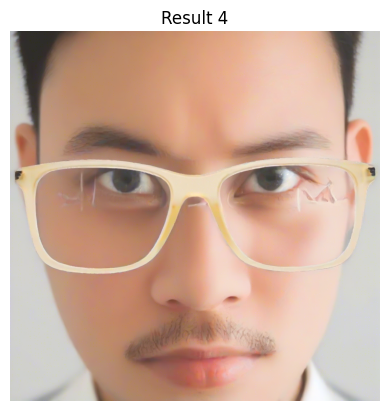

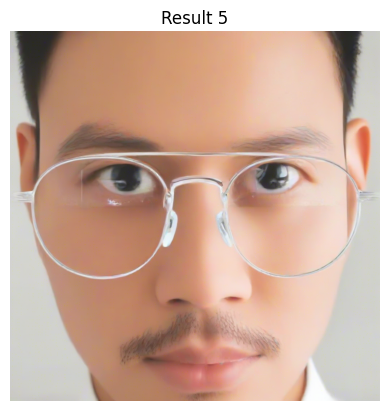

In [52]:
# simple inpainting

def sdxl_inpaint_glasses(glasses_img, mask_img, face_img, device="cuda"):
    
    face_resized = face_img.resize((1024,1024))
    mask_resized = mask_img.resize((1024,1024))
    glasses_resized = glasses_img.resize((1024,1024))
    
    gradient_mask = Image.fromarray(np.array(mask_resized)).filter(ImageFilter.GaussianBlur(radius=11))
    mask_inverted = Image.fromarray(255 - np.array(gradient_mask))
    
    composite = face_resized.copy()
    composite.paste(glasses_resized, (0, 0), mask_resized)

    pipe_sdxl_inpaint.safety_checker = lambda images, *args, **kwargs: (images, [False])

    result = pipe_sdxl_inpaint(
        prompt="copy lightning and shadowing style from unmasked to masked",
        image=composite,
        mask_image=mask_inverted,  # white = inpaint region
        negative_prompt="blurry, low quality, poor attention to detail, inconsistent",
        num_inference_steps=7,
        strength=0.7,
        guidance_scale=1.1
    ).images[0]
    
    # 3 - 0.8 - 3.0 or 25 - 0.7 - 7.5
    

    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = sdxl_inpaint_glasses(glasses, mask, bg_img, device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


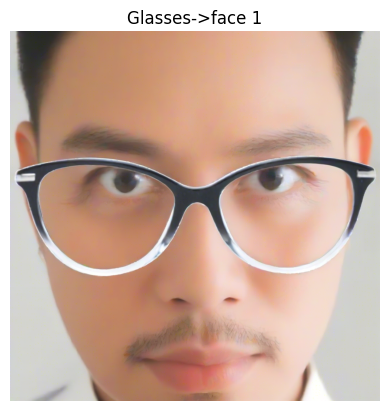

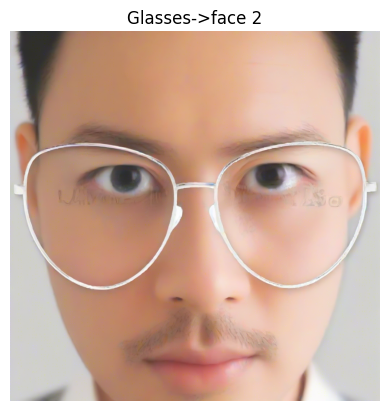

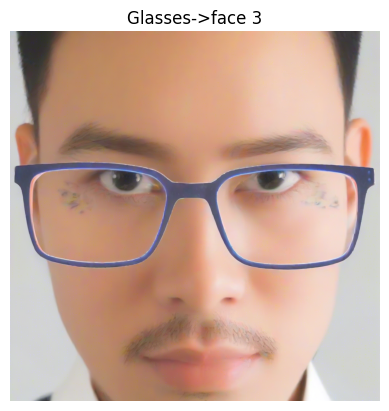

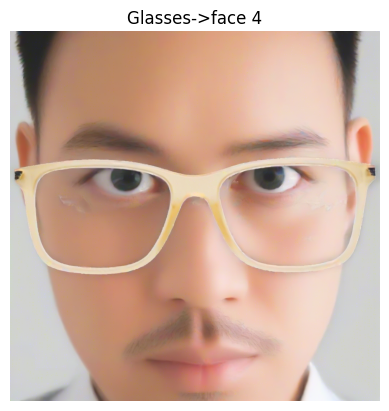

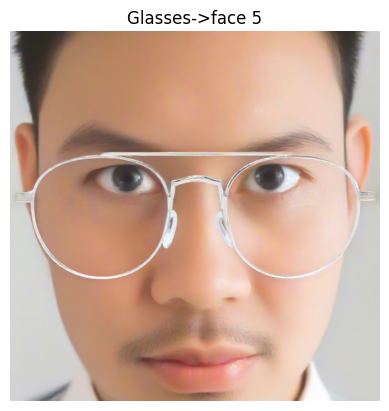

100%|██████████| 3/3 [00:00<00:00,  3.07it/s]


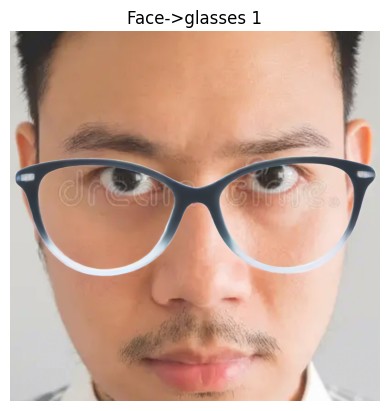

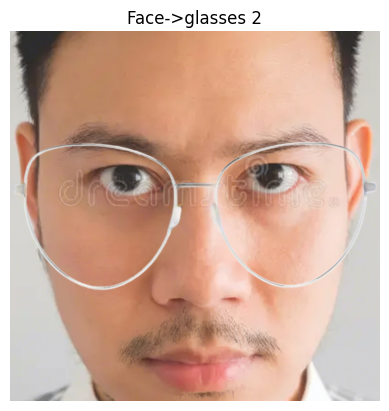

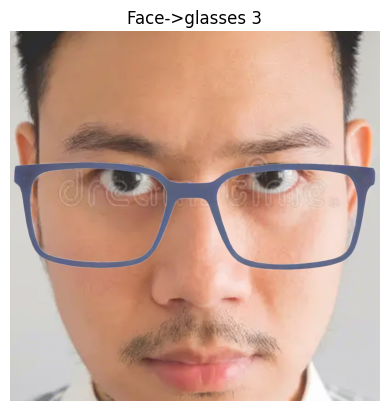

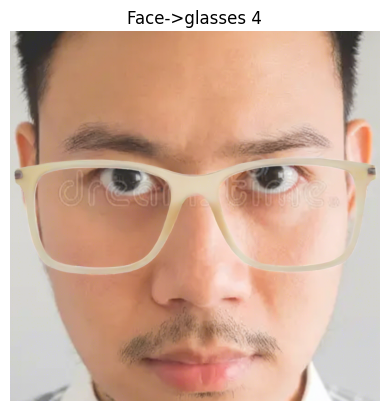

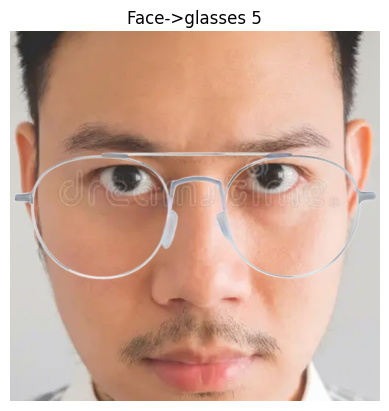

In [51]:
def attention_diffusion(glasses_img, mask_img, face_img, inverted = False, device="cuda"):
    """
    Advanced Diffusion with Attention Harmonization
    Uses attention mechanisms for precise harmonization
    """
    
    # Gradient masks for attention
    
    face_resized = face_img.resize((1024,1024))
    mask_resized = mask_img.resize((1024,1024))
    glasses_resized = glasses_img.resize((1024,1024))
    
    gradient_mask = Image.fromarray(np.array(mask_resized)).filter(ImageFilter.GaussianBlur(radius=7))

    if not inverted:
        mask_inverted = Image.fromarray(255 - np.array(mask_resized))
    else:
        mask_inverted = gradient_mask
    
    composite = face_resized.copy()
    composite.paste(glasses_resized, (0, 0), mask_resized)
    
    pipe_sd_inpaint.safety_checker = lambda images, *args, **kwargs: (images, [False])
    
    # Stable diffusion with with attention focus
    result = pipe_sdxl_inpaint( # also try sdxl_inpain
        prompt="copy lightning and shadowing style from unmasked to masked, add shadow",
        image=composite,
        mask_image=mask_inverted,
        negative_prompt="blurry, low quality, poor attention to detail, inconsistent",
        num_inference_steps=5,
        strength=0.7,
        guidance_scale=1.1
    ).images[0]
    
    
    # Apply attention-based post-processing
    result_np = np.array(result)
    face_np = np.array(face_resized)
    attention_weight = np.array(gradient_mask) / 255.0
    attention_3d = np.stack([attention_weight] * 3, axis=-1)
    
    final_result = result_np * (1 - attention_3d) + result_np * attention_3d
    return Image.fromarray(final_result.astype(np.uint8))

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = attention_diffusion(glasses, mask, bg_img, device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Glasses->face {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = attention_diffusion(glasses, mask, bg_img, inverted=True, device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Face->glasses {i+1}")
plt.show()

In [50]:
# load controlnets to be injected

depth_estimator = MidasDetector.from_pretrained(
   "lllyasviel/Annotators"
)

canny_detector = CannyDetector()

controlnet_canny = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0",
    torch_dtype=dtype,
    use_safetensors=True
).to(device)

controlnet_depth = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    use_safetensors=True
).to(device)

multi_controlnet = MultiControlNetModel([controlnet_canny, controlnet_depth])

100%|██████████| 4/4 [00:01<00:00,  2.87it/s]


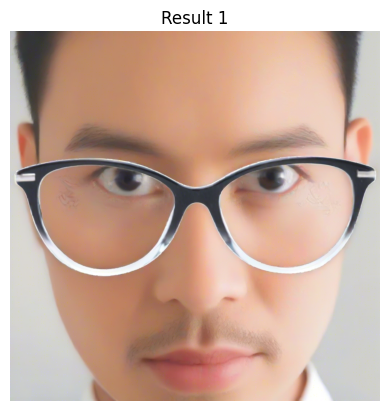

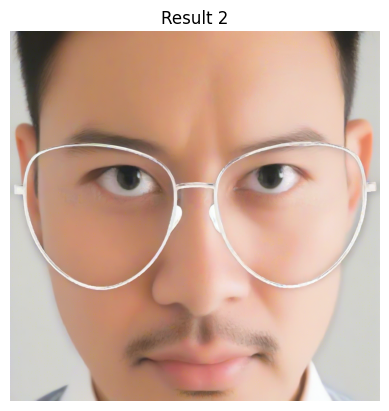

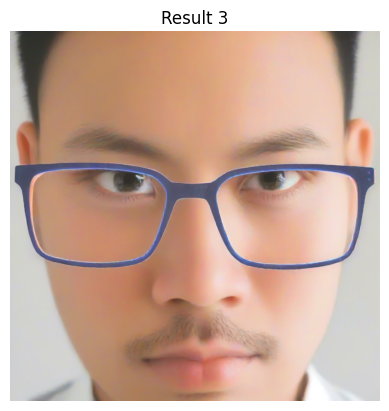

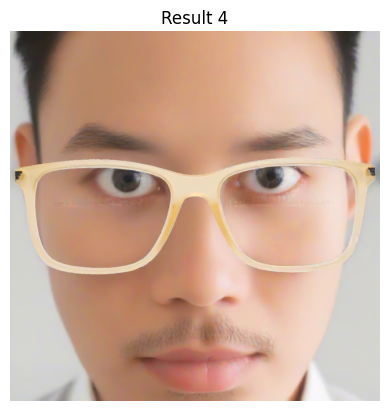

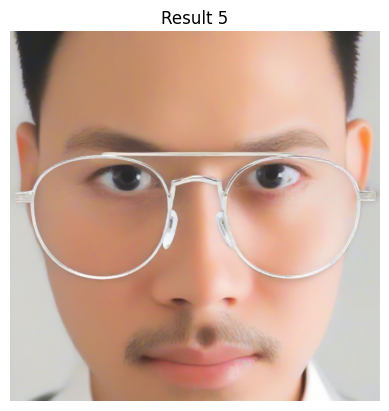

100%|██████████| 4/4 [00:01<00:00,  2.88it/s]


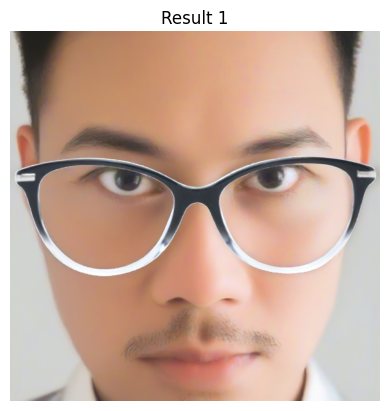

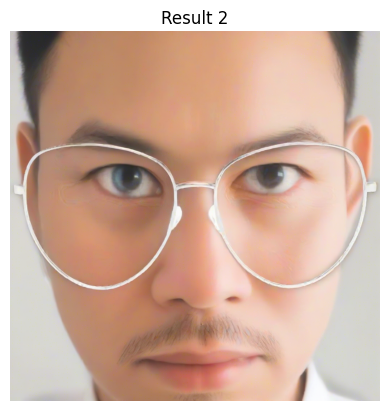

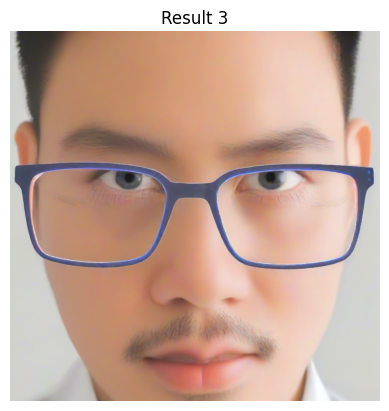

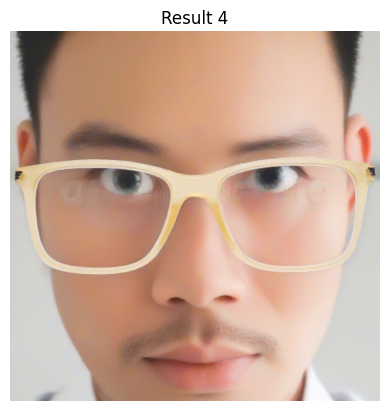

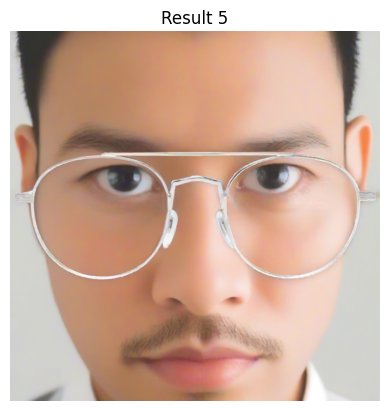

100%|██████████| 4/4 [00:01<00:00,  2.87it/s]


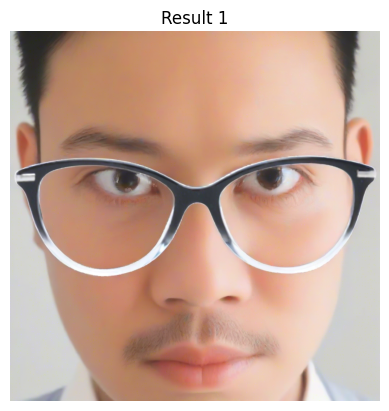

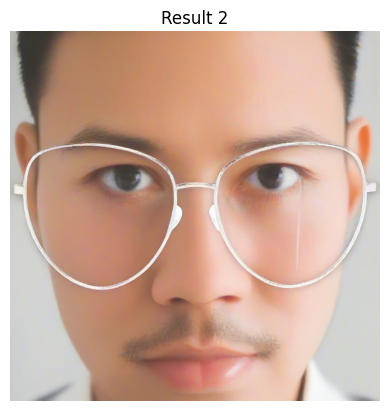

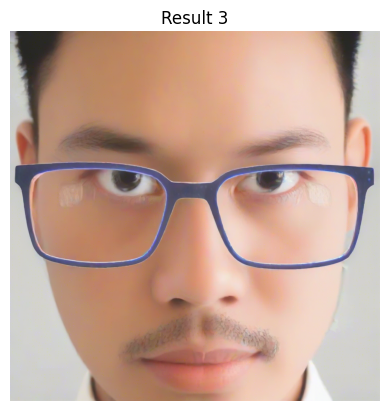

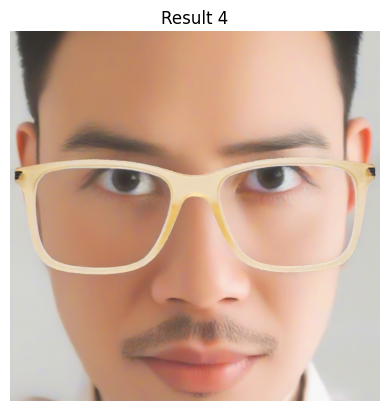

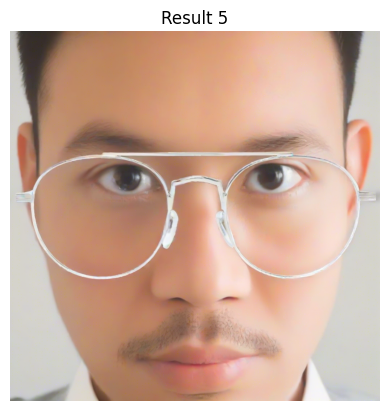

In [63]:
# simple inpainting

def sdxl_inpaint_glasses(glasses_img, mask_img, face_img, controlnet="canny", device="cuda"):
    
    glasses_resized = glasses_img.resize((1024, 1024))
    face_resized = face_img.resize((1024, 1024))
    mask_resized = mask_img.resize((1024, 1024))
    
    mask_inverted = Image.fromarray(255 - np.array(mask_resized))
    
    composite = face_resized.copy()
    composite.paste(glasses_resized, (0, 0), mask_resized)
    
    if controlnet == "canny":
        control_image = canny_detector(composite)
        pipe_sdxl_inpaint.controlnet = controlnet_canny
    elif controlnet == "depth":
        control_image = depth_estimator(composite)
        pipe_sdxl_inpaint.controlnet = controlnet_canny
    else:
        pipe_sdxl_inpaint.controlnet = multi_controlnet
        control_image = [canny_detector(composite), depth_estimator(composite)]
    
    # abuse HSFW
    pipe_sdxl_inpaint.safety_checker = lambda images, *args, **kwargs: (images, [False])

    # try with sd_inpaint too
    result = pipe_sdxl_inpaint(
        prompt="face with glasses, attention to detail, perfect harmony, natural lighting, make transition between masked un unmasked regions more smooth, transfer shadow and lightning from unmasked to masked region",
        image=composite,
        mask_image=mask_inverted,  # white = inpaint region
        negative_prompt="blurry, low quality, sharp edges, poor attention to detail, inconsistent, generated-style face",
        control_image=control_image,
        num_inference_steps=7,
        strength=0.7,
        guidance_scale=1.1
    ).images[0]
    
    # 3 - 0.8 - 3.0 or 25 - 0.7 - 7.5
    
    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = sdxl_inpaint_glasses(glasses, mask, bg_img, controlnet="canny", device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = sdxl_inpaint_glasses(glasses, mask, bg_img, controlnet="depth", device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = sdxl_inpaint_glasses(glasses, mask, bg_img, controlnet="multi", device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

In [64]:
# free up the memory
import gc

del pipe_sdxl_inpaint, pipe_sd_inpaint, controlnet_canny, controlnet_depth, multi_controlnet, canny_detector, depth_estimator
gc.collect()               # force Python garbage collection
torch.cuda.empty_cache()   # release cached blocks to CUDA

Controlnet + SDXL

Inpaint

In [65]:
pipe_sdp2p = StableDiffusionInstructPix2PixPipeline.from_pretrained(
    "timbrooks/instruct-pix2pix",
    torch_dtype=dtype,
    use_safetensors=True
).to(device)

# pipe_pbe = PaintByExamplePipeline.from_pretrained(
#     "Fantasy-Studio/Paint-by-Example",
#     torch_dtype=dtype
# ).to(device)

Loading pipeline components...: 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]


 29%|██▊       | 2/7 [00:00<00:00, 14.56it/s]

100%|██████████| 7/7 [00:00<00:00, 17.19it/s]


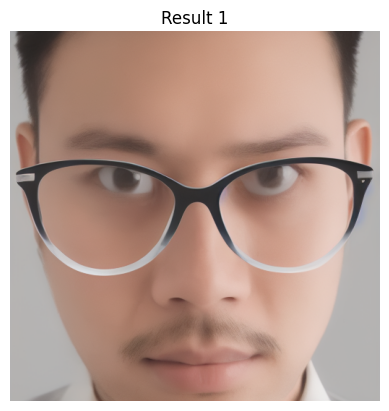

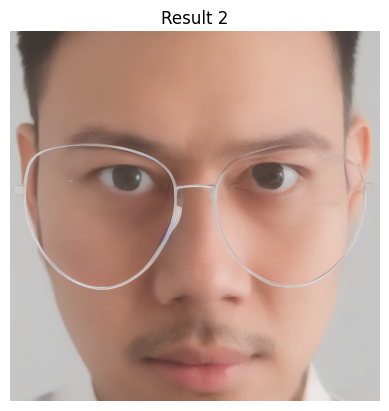

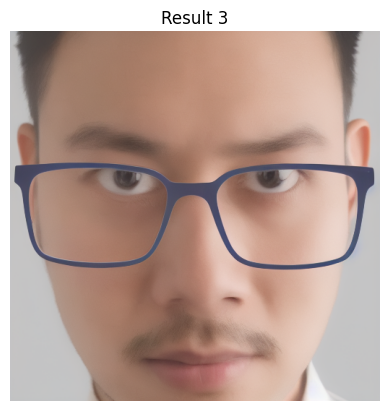

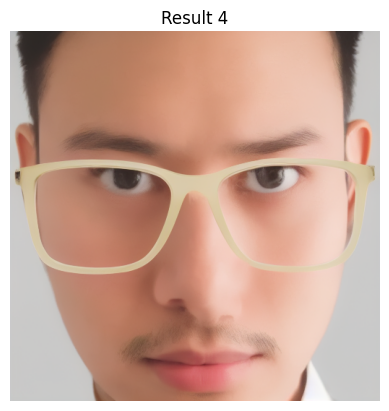

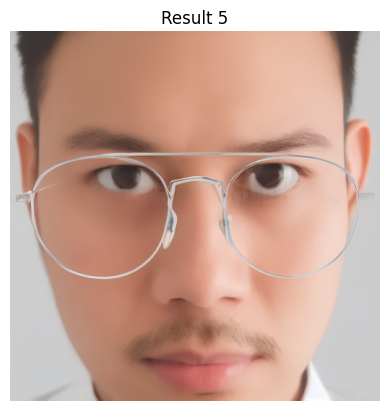

In [ ]:
def instructpix2pix_blending(glasses_img, mask_img, face_img, device="cpu"):
    """
    InstructPix2Pix Harmonization
    Uses instruction-based image editing
    """
    
    try:
        
        # Create composite image
        face_np = np.array(face_img)
        glasses_np = np.array(glasses_img)
        mask_np = np.array(mask_img)
        mask_3d = np.stack([mask_np/255.0] * 3, axis=-1)
        
        composite = face_np * (1 - mask_3d) + glasses_np * mask_3d
        composite_img = Image.fromarray(composite.astype(np.uint8))
        
        # Apply instruction-based editing
        instruction = "Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic, preserve the shape, texture and color of the glasses"
        #Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic
        
        pipe_sdp2p.safety_checker = lambda images, *args, **kwargs: (images, [False])
        
        result = pipe_sdp2p(
            instruction,
            image=composite_img,
            num_inference_steps=7, # more steps - more AI-like refinement, 7 and 11 are good, sometimes 11 should be checked
            image_guidance_scale=1.9, # the higher number, more close to original
            guidance_scale=1.0, # less follows prompt
            safety_checker=None
        ).images[0]
        
        return result
        
    except Exception as e:
        print(f"Method 5 failed: {e}")
        return None


for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = instructpix2pix_blending(glasses, mask, bg_img, device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

In [94]:
del pipe_sdp2p#, pipe_pbe

gc.collect()               # force Python garbage collection
torch.cuda.empty_cache()   # release cached blocks to CUDA

In [95]:
pipe_sd_i2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True
).to(device)

Loading pipeline components...: 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]


1it [00:00, 12.97it/s]
1it [00:00, 13.30it/s]
1it [00:00, 12.66it/s]
1it [00:00, 13.83it/s]


1it [00:00, 12.58it/s]


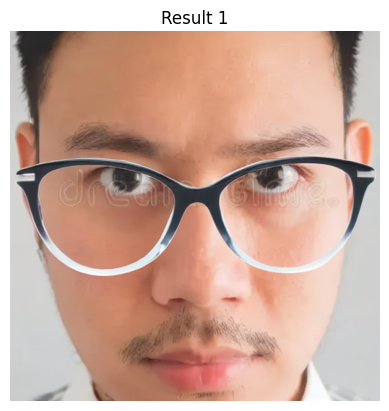

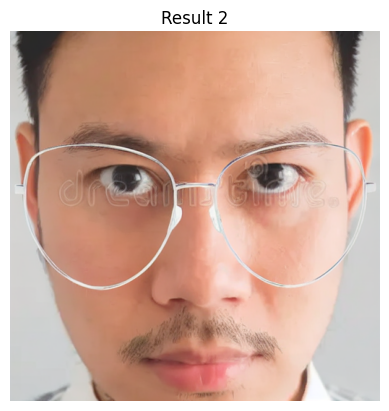

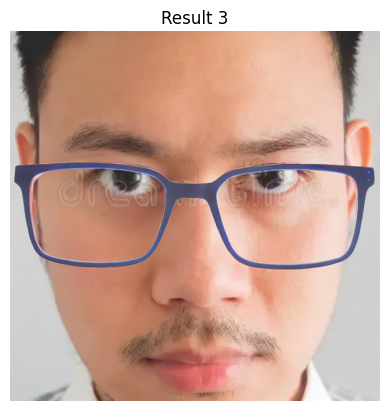

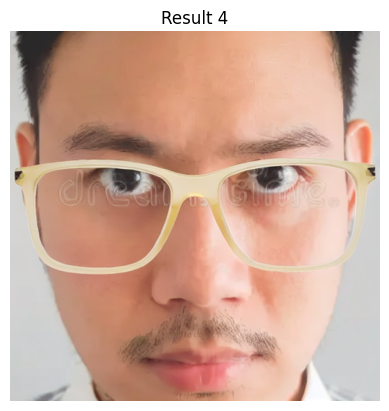

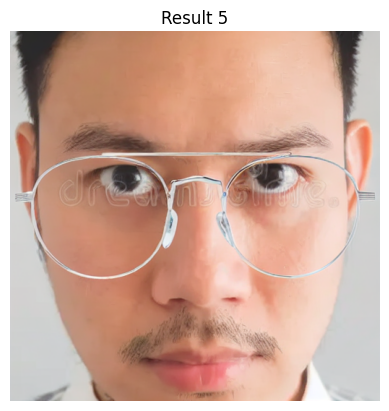

In [102]:
def diffusion_style_transfer_blending(glasses_img, mask_img, face_img, device="cuda"):
    """
    Diffusion-Based Style Transfer Harmonization
    Uses img2img diffusion for style harmonization
    """
    
    # Create composite image
    face_np = np.array(face_img)
    glasses_np = np.array(glasses_img)
    mask_np = np.array(mask_img)
    mask_3d = np.stack([mask_np/255.0] * 3, axis=-1)
    
    composite = face_np * (1 - mask_3d) + glasses_np * mask_3d
    composite_img = Image.fromarray(composite.astype(np.uint8))
    
    pipe_sd_i2i.safety_checker = lambda images, *args, **kwargs: (images, [False])
    
    # Apply style transfer
    result = pipe_sd_i2i(
        prompt="Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic, preserve the shape, texture and color of the glasses",
        image=composite_img,
        negative_prompt="inconsistent, harsh lighting, unrealistic",
        num_inference_steps=5,
        strength=0.15, # how much noise is added
        guidance_scale=0.7 # how much to follow the prompt
    ).images[0]
    
    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = diffusion_style_transfer_blending(glasses, mask, bg_img, device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

1it [00:00, 14.20it/s]
1it [00:00, 13.07it/s]
1it [00:00, 12.77it/s]
0it [00:00, ?it/s]

1it [00:00, 13.00it/s]
1it [00:00, 12.85it/s]
1it [00:00, 12.97it/s]
1it [00:00, 12.66it/s]
1it [00:00, 12.74it/s]
1it [00:00, 13.27it/s]
1it [00:00, 12.82it/s]


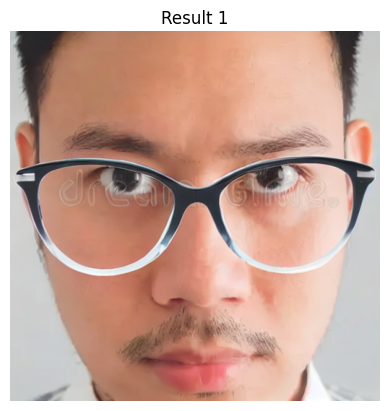

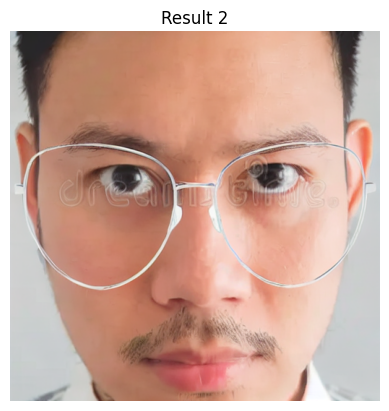

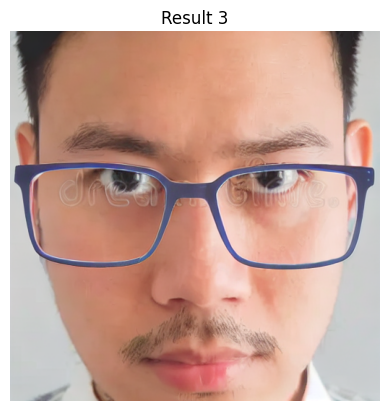

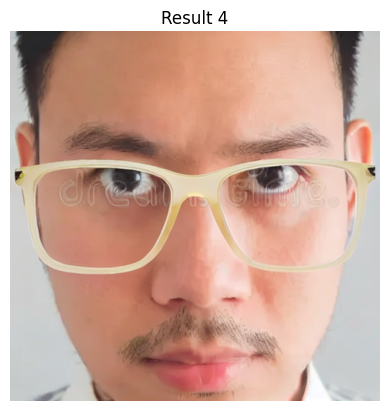

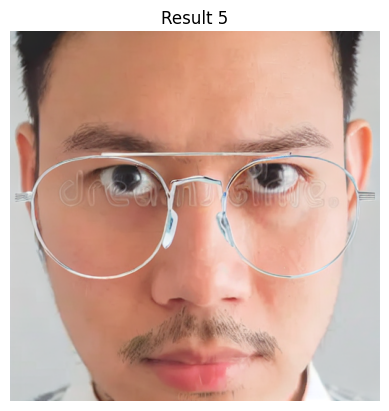

In [104]:
def cycle_consistent_blending(glasses_img, mask_img, face_img, device="cuda"):
    """
    Cycle-Consistent Diffusion Harmonization
    Uses multiple passes for cycle consistency
    """
    
    # Create initial composite
    face_np = np.array(face_img)
    glasses_np = np.array(glasses_img)
    mask_np = np.array(mask_img)
    mask_3d = np.stack([mask_np/255.0] * 3, axis=-1)
    
    composite = face_np * (1 - mask_3d) + glasses_np * mask_3d
    composite_img = Image.fromarray(composite.astype(np.uint8))
    
    pipe_sd_i2i.safety_checker = lambda images, *args, **kwargs: (images, [False])
    
    # Forward pass
    result = pipe_sd_i2i(
        prompt="Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic, preserve the shape, texture and color of the glasses",
        image=composite_img,
        negative_prompt="inconsistent, harsh lighting, unrealistic",
        num_inference_steps=5,
        strength=0.15,
        guidance_scale=0.7
    ).images[0]
    
    # Refinement pass
    result = pipe_sd_i2i(
        prompt="Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic, preserve the shape, texture and color of the glasses",
        image=result,
        negative_prompt="inconsistent, harsh lighting, unrealistic",
        num_inference_steps=3,
        strength=0.07,
        guidance_scale=0.6
    ).images[0]
    
    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = cycle_consistent_blending(glasses, mask, bg_img, device=device)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

In [105]:
del pipe_sd_i2i

gc.collect()               # force Python garbage collection
torch.cuda.empty_cache()   # release cached blocks to CUDA